<a href="https://colab.research.google.com/github/UendiMagilaj/ComputerVision-Exercises/blob/main/Exercise1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<ipython-input-4-b44ffe7e0a9f>:3: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC)


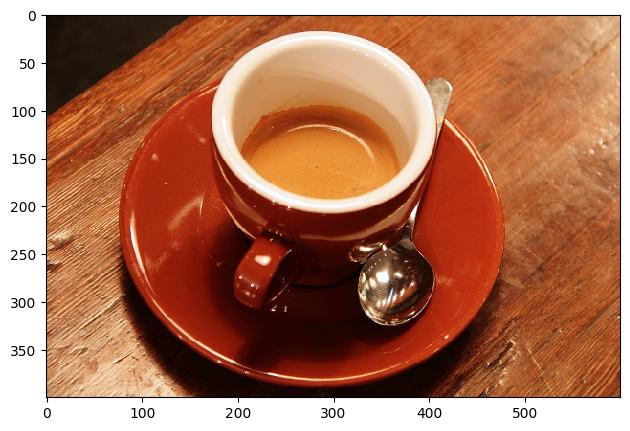

In [4]:
#Task 1
import skimage as sk
img = sk.data.coffee()
sk.io.imshow(IC)

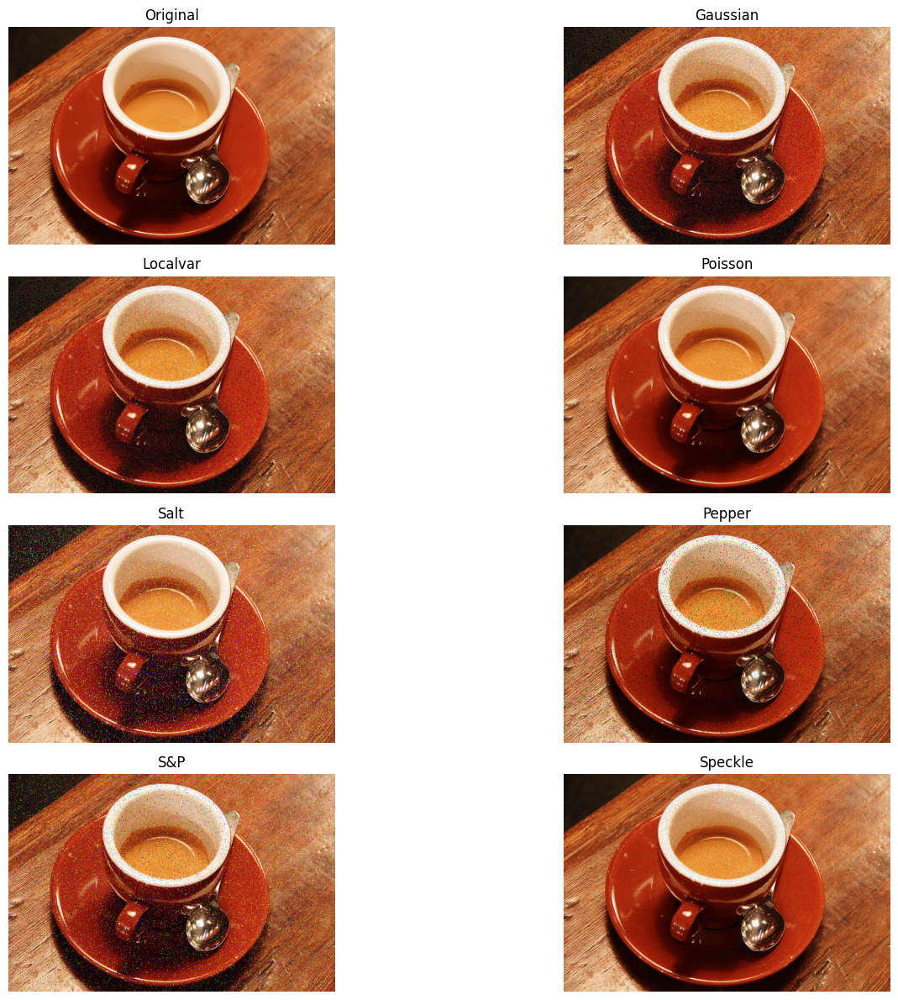

In [16]:
#Task 2
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise

image=img_as_float(data.coffee())
local_var_map=np.full(image.shape, 0.01)

noises = {
    "Original": image,
    "Gaussian": random_noise(image, mode='gaussian', var=0.01),
    "Localvar": random_noise(image, mode='localvar', local_vars=local_var_map),
    "Poisson": random_noise(image, mode='poisson'),
    "Salt": random_noise(image, mode='salt', amount=0.05),
    "Pepper": random_noise(image, mode='pepper', amount=0.05),
    "S&P": random_noise(image, mode='s&p', amount=0.05),
    "Speckle": random_noise(image, mode='speckle', var=0.01)
}

fig,ax=plt.subplots(4, 2, figsize=(16, 12))
ax=ax.ravel()
for i,(title, img) in enumerate(noises.items()):
    ax[i].imshow(img)
    ax[i].set_title(title)
    ax[i].axis('off')

plt.tight_layout()
plt.savefig('coffee_noises.png')
plt.show()

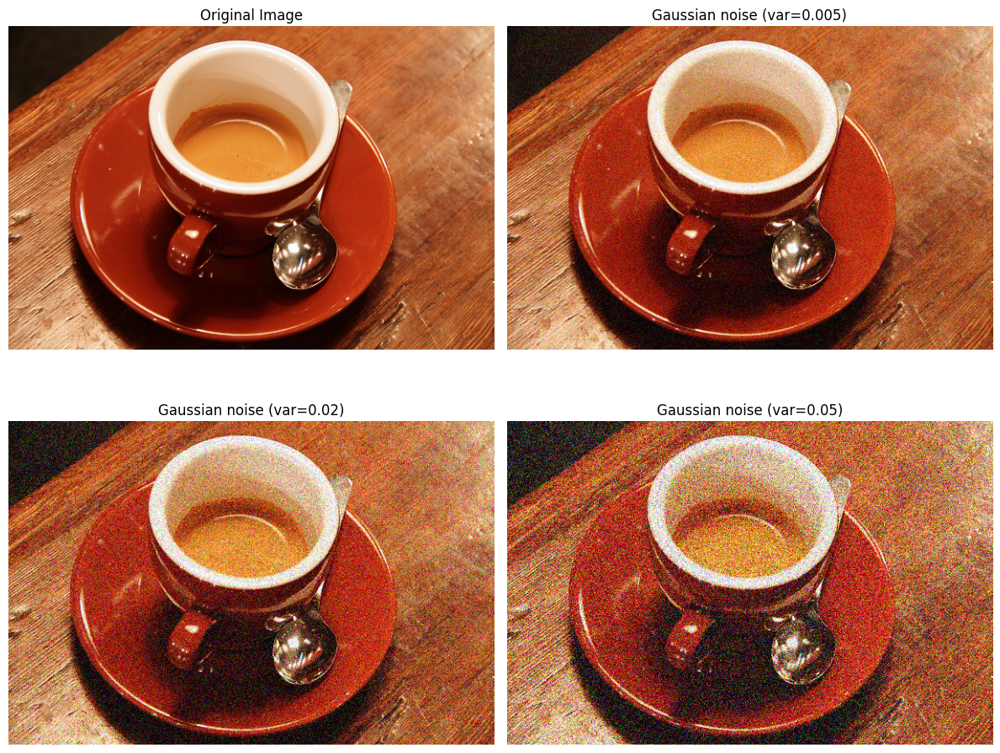

In [17]:
#Task 3
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise


image=img_as_float(data.coffee())
noisy1=random_noise(image, mode='gaussian', var=0.005)
noisy2=random_noise(image, mode='gaussian', var=0.02)
noisy3=random_noise(image, mode='gaussian', var=0.05)
fig, ax=plt.subplots(2, 2, figsize=(12, 10))

ax[0, 0].imshow(image)
ax[0, 0].set_title("Original Image")
ax[0, 0].axis('off')

ax[0, 1].imshow(noisy1)
ax[0, 1].set_title("Gaussian noise (var=0.005)")
ax[0, 1].axis('off')

ax[1, 0].imshow(noisy2)
ax[1, 0].set_title("Gaussian noise (var=0.02)")
ax[1, 0].axis('off')

ax[1, 1].imshow(noisy3)
ax[1, 1].set_title("Gaussian noise (var=0.05)")
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()

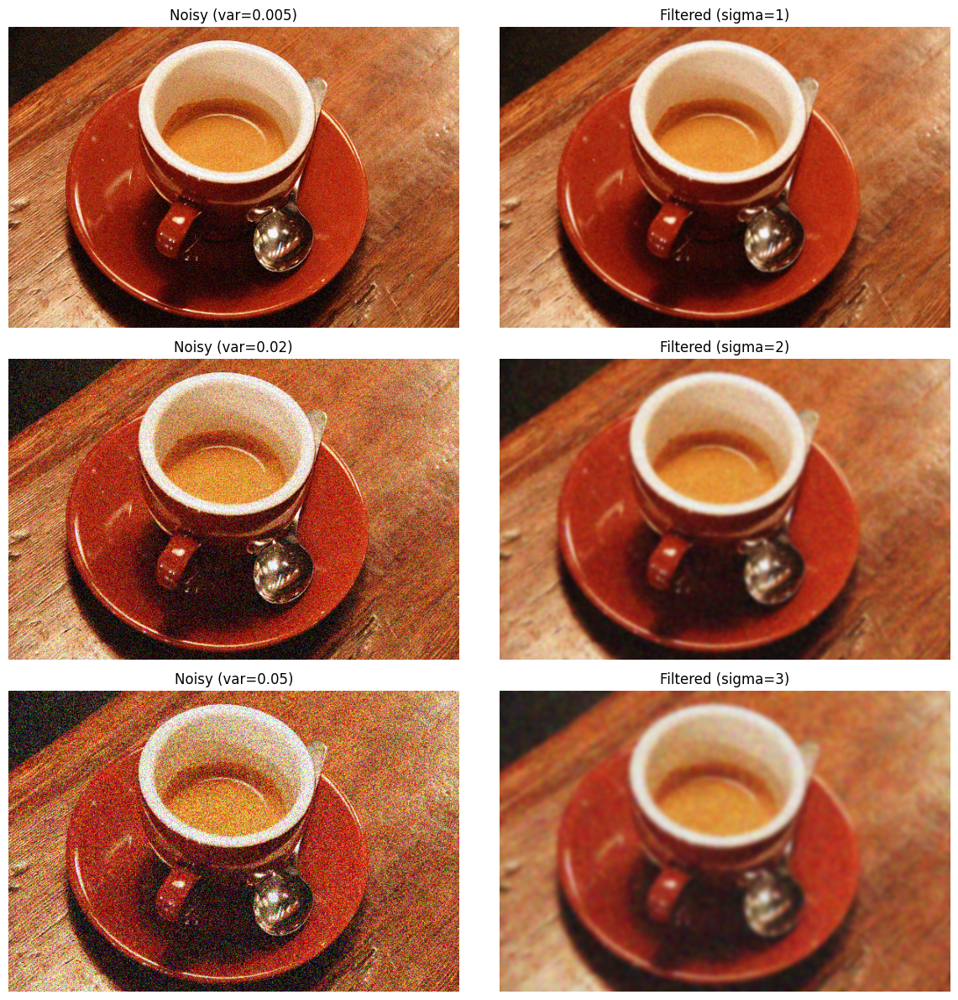

In [18]:
#Task 4

import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise
from skimage.filters import gaussian


image=img_as_float(data.coffee())
noisy1=random_noise(image, mode='gaussian', var=0.005)
noisy2=random_noise(image, mode='gaussian', var=0.02)
noisy3=random_noise(image, mode='gaussian', var=0.05)


filtered1=gaussian(noisy1, sigma=1, channel_axis=-1)
filtered2=gaussian(noisy2, sigma=2, channel_axis=-1)
filtered3=gaussian(noisy3, sigma=3, channel_axis=-1)
fig,ax=plt.subplots(3, 2, figsize=(12, 12))

ax[0,0].imshow(noisy1)
ax[0,0].set_title("Noisy (var=0.005)")
ax[0,0].axis('off')
ax[0,1].imshow(filtered1)
ax[0,1].set_title("Filtered (sigma=1)")
ax[0,1].axis('off')

ax[1,0].imshow(noisy2)
ax[1,0].set_title("Noisy (var=0.02)")
ax[1,0].axis('off')
ax[1,1].imshow(filtered2)
ax[1,1].set_title("Filtered (sigma=2)")
ax[1,1].axis('off')

ax[2,0].imshow(noisy3)
ax[2,0].set_title("Noisy (var=0.05)")
ax[2,0].axis('off')
ax[2,1].imshow(filtered3)
ax[2,1].set_title("Filtered (sigma=3)")
ax[2,1].axis('off')

plt.tight_layout()
plt.show()

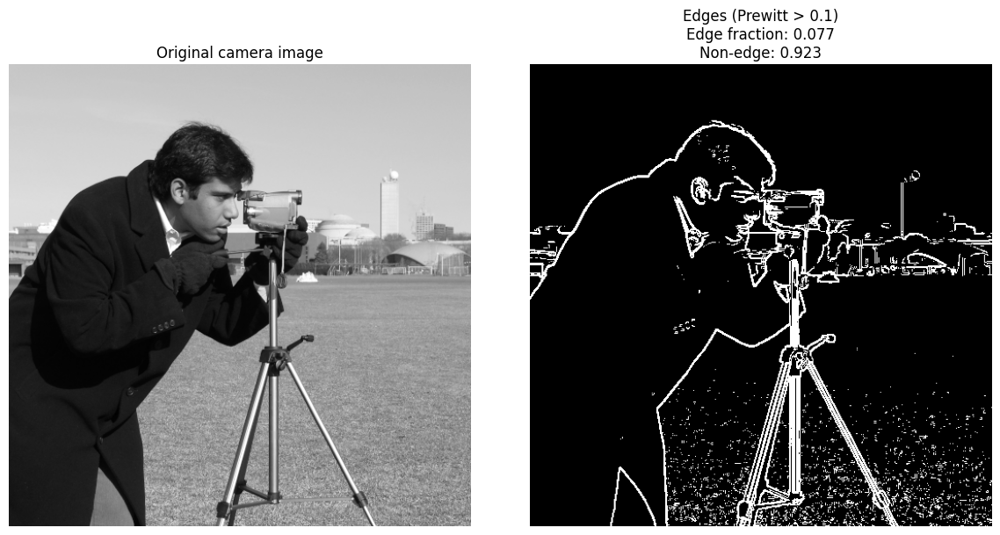

In [24]:
#Task 5
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, filters, color

#image = img_as_float(data.bricks())
#image_gray = color.rgb2gray(image)
#data.bricks() does not exist in my version of scikit-image so I used a replacement

image =data.camera()
edges=filters.prewitt(image)
threshold=0.1
binary_edges=edges>threshold

total_pixels=image.size
edge_pixels=np.sum(binary_edges)
non_edge_pixels=total_pixels-edge_pixels
fraction_edges=edge_pixels/total_pixels
fraction_non_edges=non_edge_pixels/total_pixels

fig,ax=plt.subplots(1, 2,figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original camera image')
ax[0].axis('off')

ax[1].imshow(binary_edges, cmap='gray')
ax[1].set_title(f'Edges (Prewitt > {threshold})\n'
                f'Edge fraction: {fraction_edges:.3f}\n'
                f'Non-edge: {fraction_non_edges:.3f}')
ax[1].axis('off')

plt.tight_layout()
plt.show()

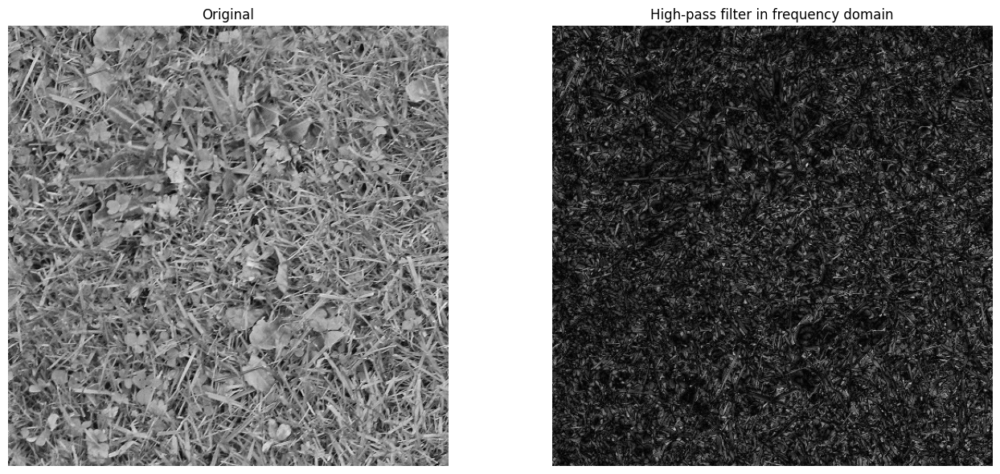

In [33]:
from skimage.data import grass
import numpy as np
import matplotlib.pyplot as plt

img = grass()

def plot_comparison(original, filtered, title):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6), sharex=True, sharey=True)
    ax1.imshow(original, cmap='gray')
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap='gray')
    ax2.set_title(title)
    ax2.axis('off')
    plt.tight_layout()
    plt.show()


#HIGH-PASS FILTER
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
rows, cols = img.shape
crow, ccol = int(rows/2), int(cols/2)
fshift[crow-30:crow+30, ccol-30:ccol+30] = 0
f_ishift = np.fft.ifftshift(fshift)
img_highpass = np.fft.ifft2(f_ishift)
img_highpass = np.abs(img_highpass)

plot_comparison(img, img_highpass, 'High-pass filter in frequency domain')
plt.imsave('highpass_grass.png', img_highpass, cmap='gray')

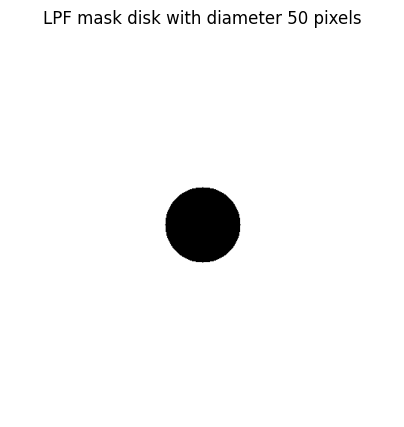

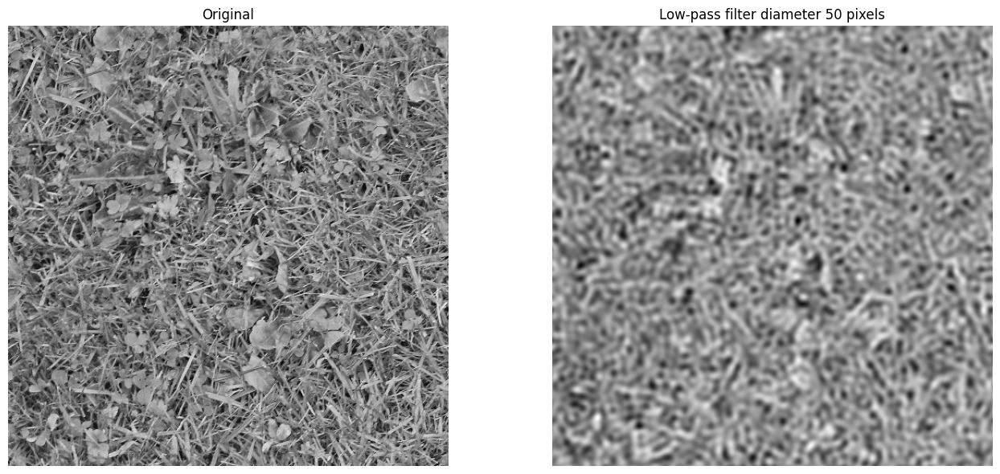

In [34]:
#LOW-PASS FILTER

f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)

nrows, ncols = img.shape
row, col = np.ogrid[:nrows, :ncols]
cnt_row, cnt_col = nrows / 2, ncols / 2
disk_diameter = 50
outer_disk_mask = ((row - cnt_row)**2 + (col - cnt_col)**2 > (disk_diameter)**2)

fshift[outer_disk_mask] = 0
f_ishift = np.fft.ifftshift(fshift)

img_lowpass = np.fft.ifft2(f_ishift)
img_lowpass = np.abs(img_lowpass)

fig = plt.figure(figsize=(5, 5))
plt.imshow(outer_disk_mask, cmap=plt.cm.gray)
plt.title('LPF mask disk with diameter {} pixels'.format(disk_diameter))
plt.axis('off')
plt.show()

plot_comparison(img, img_lowpass, 'Low-pass filter diameter {} pixels'.format(disk_diameter))
plt.imsave('lowpass_grass.png', img_lowpass, cmap='gray')

Number of erosions until all blobs are removed: 7


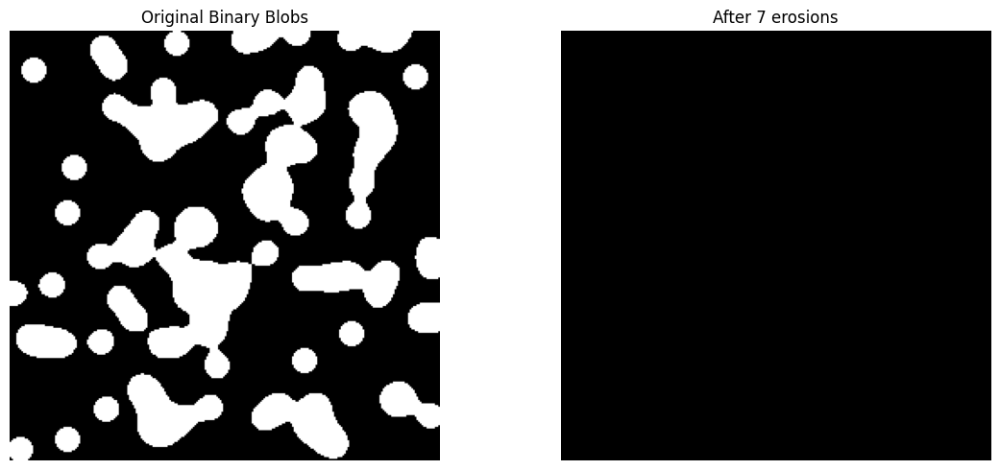

In [32]:
#Task 7
import numpy as np
import matplotlib.pyplot as plt
from skimage.data import binary_blobs
from skimage.morphology import erosion, disk

# Step 1: Generate binary blob image
blobs = binary_blobs(length=256, blob_size_fraction=0.1, volume_fraction=0.3)

# Step 2: Create structuring element (disk of radius 3)
selem = disk(3)

# Step 3: Repeated erosions
blobs_eroded = blobs.copy()
count = 0

while np.any(blobs_eroded):  # Stop when all pixels are zero
    blobs_eroded = erosion(blobs_eroded, selem)
    count += 1

print(f"Number of erosions until all blobs are removed: {count}")

# Step 4: Visualization
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].imshow(blobs, cmap='gray')
ax[0].set_title("Original Binary Blobs")
ax[0].axis('off')

ax[1].imshow(blobs_eroded, cmap='gray')
ax[1].set_title(f"After {count} erosions")
ax[1].axis('off')

plt.tight_layout()
plt.show()